In [1]:
## IMPORTANT !

# In the first order need to set the number of CPU 
# for calculation before launching (depends on computer's number of cores)
n_jobs= 30

#libraries
import pandas as pd
import numpy as np
import os
import sys
import shutil
import glob
import joblib
import warnings
from datetime import date, datetime

from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import GroupKFold
from sklearn.model_selection import LeavePGroupsOut
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample

import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import pearsonr
import scipy.stats as st

from nilearn import image as nli
from nilearn import plotting

import copy

In [2]:
#@title Import functions
%matplotlib inline  
#!pip install brainspace --quiet
import ipywidgets as widgets  

# Interactive plots
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets # interactive display
my_layout = widgets.Layout()

import numpy as np
from brainspace.datasets import load_conte69
from brainspace.plotting import plot_hemispheres, plot_surf
from brainspace.utils.parcellation import map_to_labels
from brainspace.mesh import mesh_cluster
import panel as pn
pn.extension('vtk')
import os # OS to handle paths
import pandas as pd # pandas for data framse
import csv
import urllib.request as urllib2

import matplotlib.pyplot as plt # For changing the color maps
from matplotlib import cm # cm=colormap
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
# from hcp_regions import HCPRegions
import ipywidgets as widgets       # interactive display

from brainspace.datasets import load_fsa5
from nilearn import datasets
from brainspace.utils.parcellation import reduce_by_labels

In [3]:
#load path to orig tables
path='/media/data/HCPAging/data/MLTablesMultCon/'

In [4]:
#load some features tables as dictionary
features = {
    'carit1':pd.read_csv(path+'carit-con1.csv', index_col=0),
    'surf':pd.read_csv(path+'surf.csv', index_col=0),
    'subc':pd.read_csv(path+'subc.csv', index_col=0),
    'VolBrain':pd.read_csv(path+'VolBrain.csv', index_col=0),
    
    'rest':pd.read_csv(path+'rest_hpass.csv', index_col=0) 

}

In [5]:
#load labels from orig tables
ind_task = features['carit1'].columns.values
ind_anat = features['surf'].columns.values
ind_subc = features['subc'].columns.values
ind_bVol = features['VolBrain'].columns.values
ind_FC = features['rest'].columns.values

In [6]:
#path to ML outputs
nmf=path+'output_5cv_sexAdj_noStdTarg_STDstackFeatures_SHAP_interview_age'
path2 = nmf+'/'

#read number of folds
folders = sorted((os.listdir(path2)))[:1]
print(path2)
print(folders)

/media/data/HCPAging/data/MLTablesMultCon/output_5cv_sexAdj_noStdTarg_STDstackFeatures_SHAP_interview_age/
['Fold_0']


In [8]:
ddir = 'interview_age'
#os.mkdir(nmf+'/'+ddir)
path_img_out = nmf+'/'+ddir+'/'

In [9]:
#Labels
#labels for single modalities and stack
lblY = ['CARIT: NoGo-Go',
'CARIT: Go',
'CARIT: NoGo',
'FACENAME: Encoding',
'FACENAME: Recall',
'FACENAME: Distractor',
'FACENAME: Encoding-Recall',
'FACENAME: Encoding-Distractor',
'FACENAME: Recall-Distractor',
'VISMOTOR: Vismotor',
'CARIT: FC',
'FACENAME: FC',
'VISUAL MOTOR: FC',
'Cortical Thickness',
'Cortical Surface',
'Subcortical Volume',
'Total Brain Volume',
'Resting State FC',
'Stacked: All', #set1
'Stacked: Task Contrast', #set2
'Stacked: Non Task', #set3
'Stacked: Task FC', #set4
'Stacked: Task Contrast & FC', #set5
'Stacked: All excluding Task FC', #set6  with Task GLM
'Stacked: All excluding Task Contrast',  #set7 with Task FC
'Stacked: Resting and Task FC'] #set8

#labels for single modalities within each stack
lbl_set1 = ['carit1', 'carit3', 'carit4', 'face1', 'face2', 'face3', 'face4', 'face5', 'face6', 'vism', 
            'carit_FC', 'face_FC', 'vism_FC', 
            'cort', 'surf', 'subc', 'VolBrain', 'rest']

lbl_set2 = ['carit1', 'carit3', 'carit4', 'face1', 'face2', 'face3', 'face4', 'face5', 'face6', 'vism']
lbl_set3 = ['cort', 'subc', 'surf', 'rest', 'VolBrain']

lbl_set4 = ['carit_FC', 'face_FC', 'vism_FC']
lbl_set5 = ['carit1', 'carit3', 'carit4', 'face1', 'face2', 'face3', 'face4', 'face5', 'face6', 'vism', 
            'carit_FC', 'face_FC', 'vism_FC']
lbl_set6 = ['carit1', 'carit3', 'carit4', 'face1', 'face2', 'face3', 'face4', 'face5', 'face6', 'vism', 
            'cort', 'subc', 'surf', 'rest', 'VolBrain']
lbl_set7 = ['carit_FC', 'face_FC', 'vism_FC', 'cort', 
            'subc', 'surf', 'rest', 'VolBrain']
lbl_set8 = ['carit_FC', 'face_FC', 'vism_FC', 'rest']

In [10]:
#extract feature importance from saved models

warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

dct_stack_coeff={} #empty dct to store 

nsets = ['set1', 'set2', 'set3', 'set4', 'set5', 'set6', 'set7', 'set8']
lblssets = [lbl_set1, lbl_set2, lbl_set3, lbl_set4, lbl_set5, lbl_set6, lbl_set7, lbl_set8]

for nset, lblsset in zip(nsets, lblssets):
    dct_ = {}
    #extracting feature importance for each fold and each stack model
    for fold in folders:
        dct_[fold] = (joblib.load(path2+fold+'/'+nset+'_stacked_model.sav')).named_steps['elasticnet'].coef_
    df = pd.DataFrame(dct_ , index=lblsset).T 
    #save as separate table
    df.to_csv(path2+nset+'_stacked_coeffs.csv') 
    #save to dictionary
    dct_stack_coeff[nset] = df

In [11]:
#print mean feature importance for each stack before plotting

for key in dct_stack_coeff.keys():
    print(key)
    display(dct_stack_coeff[key].mean().sort_values(ascending=False))
    print(' ')

set1


cort        48.970030
subc        22.216104
vism        20.764815
face5       20.292937
surf        17.400152
rest        17.390439
carit3      15.342530
face2       10.011336
carit1       7.899544
face_FC      6.297509
face6        6.253644
carit_FC     6.175262
carit4       4.295519
face4        1.196931
face1        0.744166
face3       -2.248711
VolBrain    -4.233095
vism_FC    -10.507506
dtype: float64

 
set2


face5     35.608543
vism      35.415431
carit3    29.840220
face6     19.616885
carit1    17.674721
carit4    11.991623
face2     11.328623
face3      9.837687
face4      5.641064
face1      3.483801
dtype: float64

 
set3


cort        86.276872
rest        46.844322
subc        35.423583
surf        22.959988
VolBrain   -17.786620
dtype: float64

 
set4


face_FC     62.682708
carit_FC    58.287265
vism_FC     26.392353
dtype: float64

 
set5


face5       30.880040
vism        29.059579
carit3      26.089816
face_FC     19.541251
carit_FC    18.789732
face6       16.363574
carit1      11.889102
carit4       8.833340
face2        8.219717
face3        4.455879
face4        3.100244
face1        2.142239
vism_FC      0.000000
dtype: float64

 
set6


cort        51.735199
subc        22.755149
vism        20.391207
face5       20.385000
rest        18.141608
surf        17.533064
carit3      15.712452
face2       11.531131
carit1       8.224729
face6        5.378212
carit4       4.109819
face4        1.316105
face1        0.000000
face3       -3.044391
VolBrain    -5.715349
dtype: float64

 
set7


cort        80.930245
rest        30.274191
subc        27.625277
surf        19.607178
face_FC     16.046614
carit_FC    12.583961
vism_FC      0.000000
VolBrain   -11.321844
dtype: float64

 
set8


rest        69.595395
face_FC     41.292557
carit_FC    38.435950
vism_FC      3.647153
dtype: float64

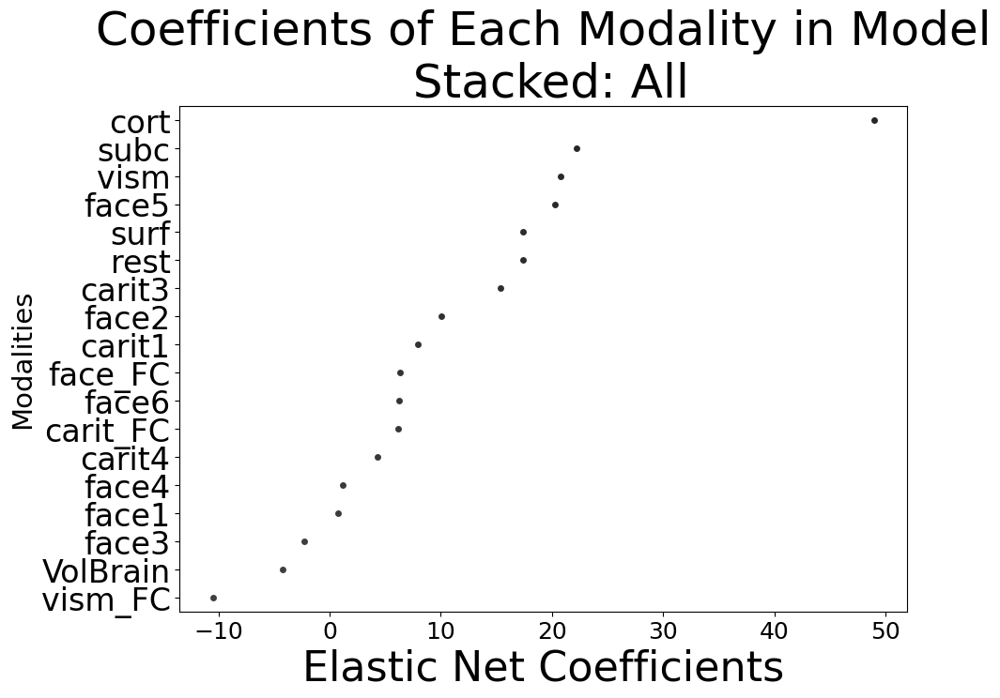

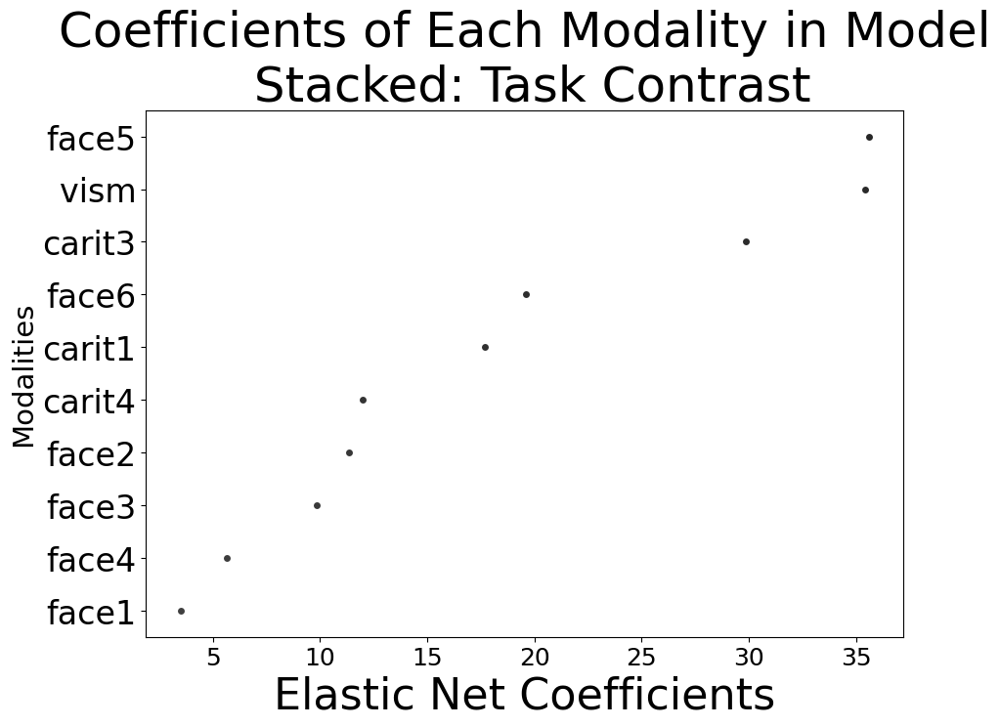

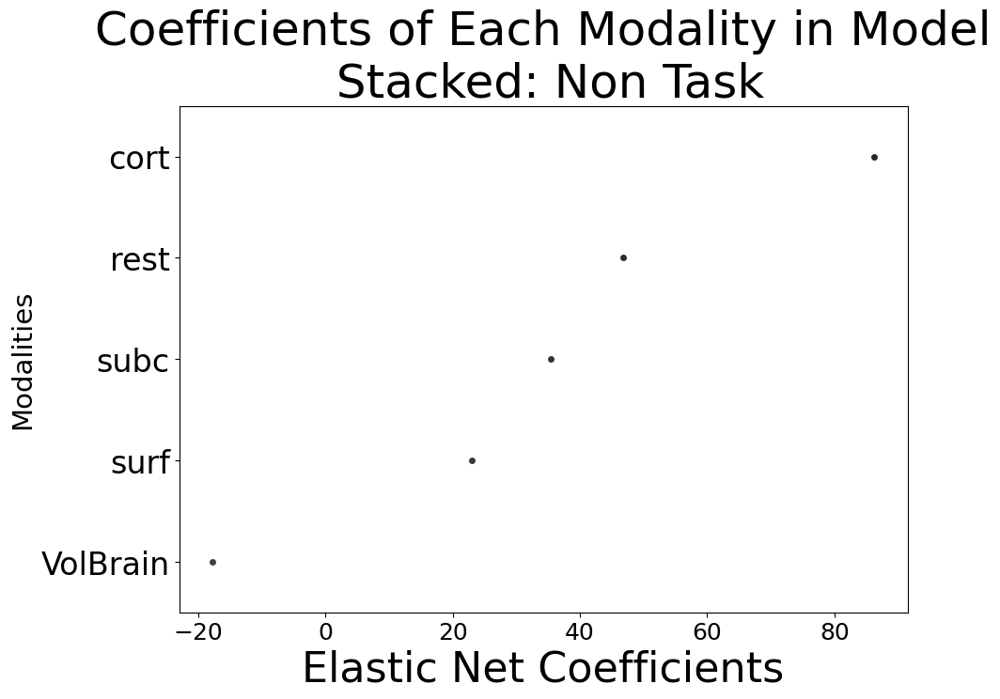

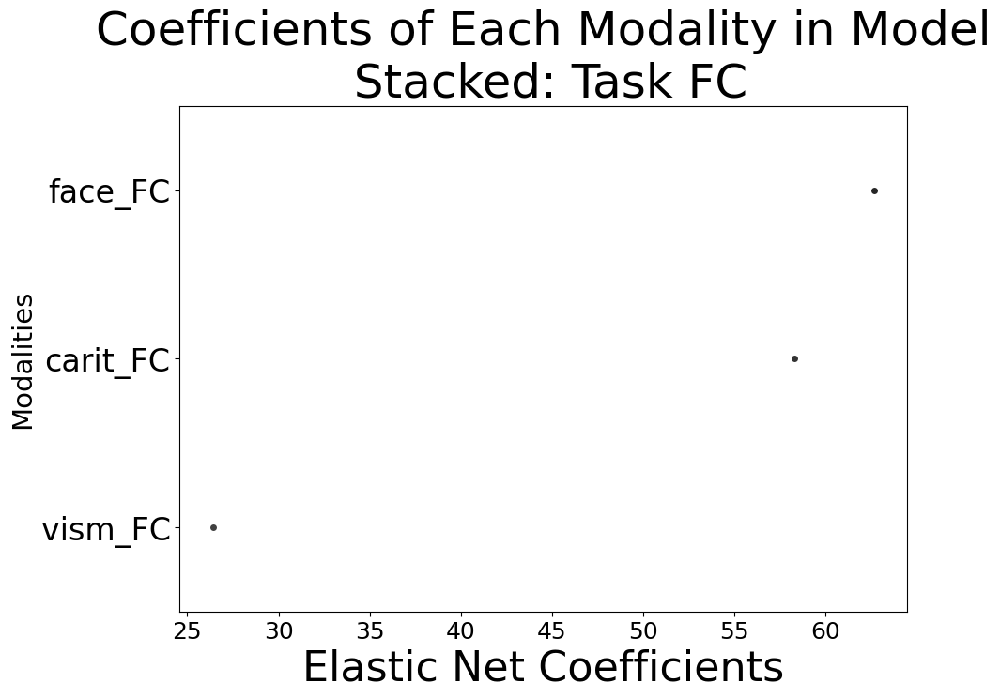

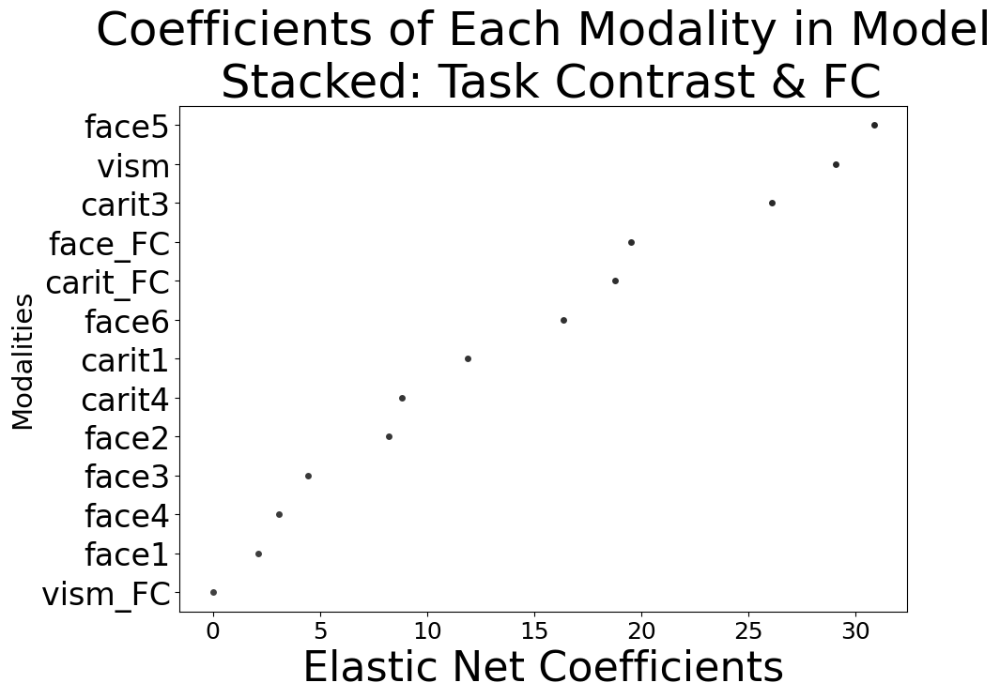

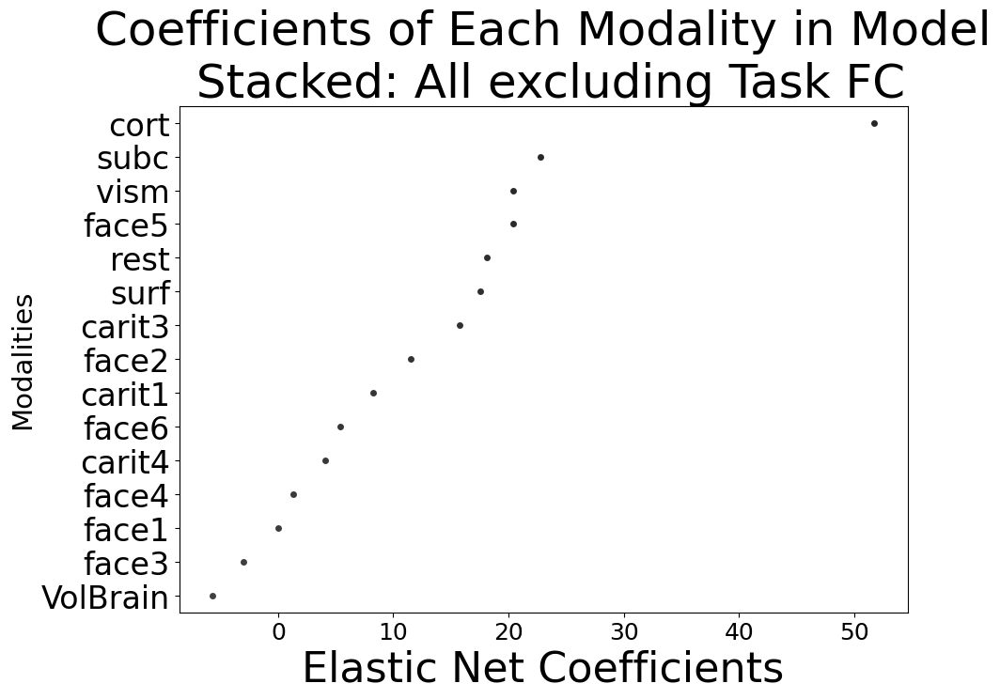

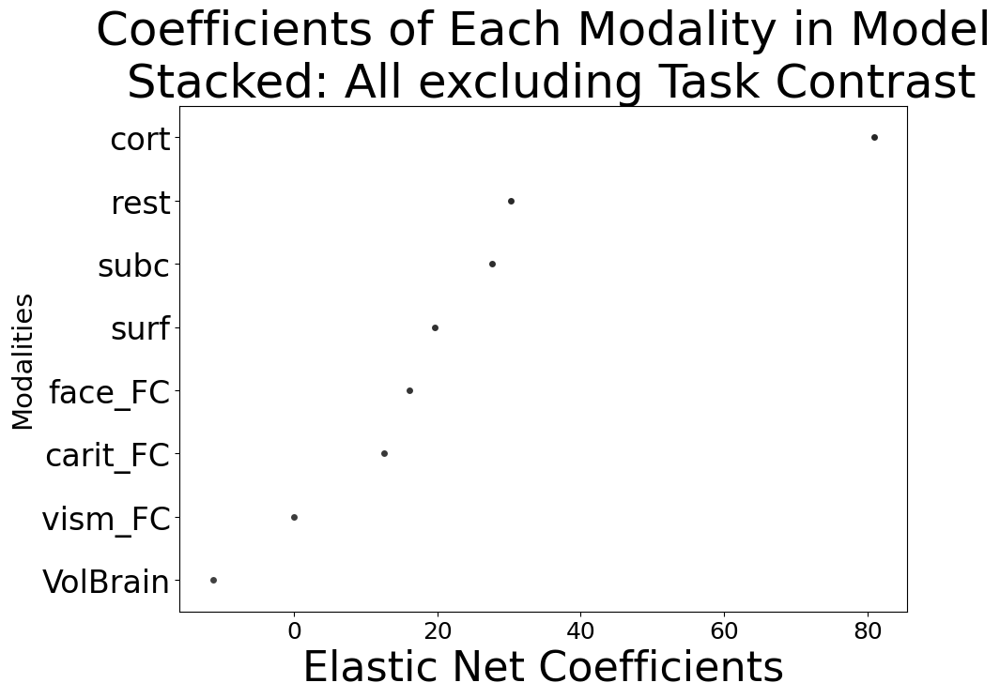

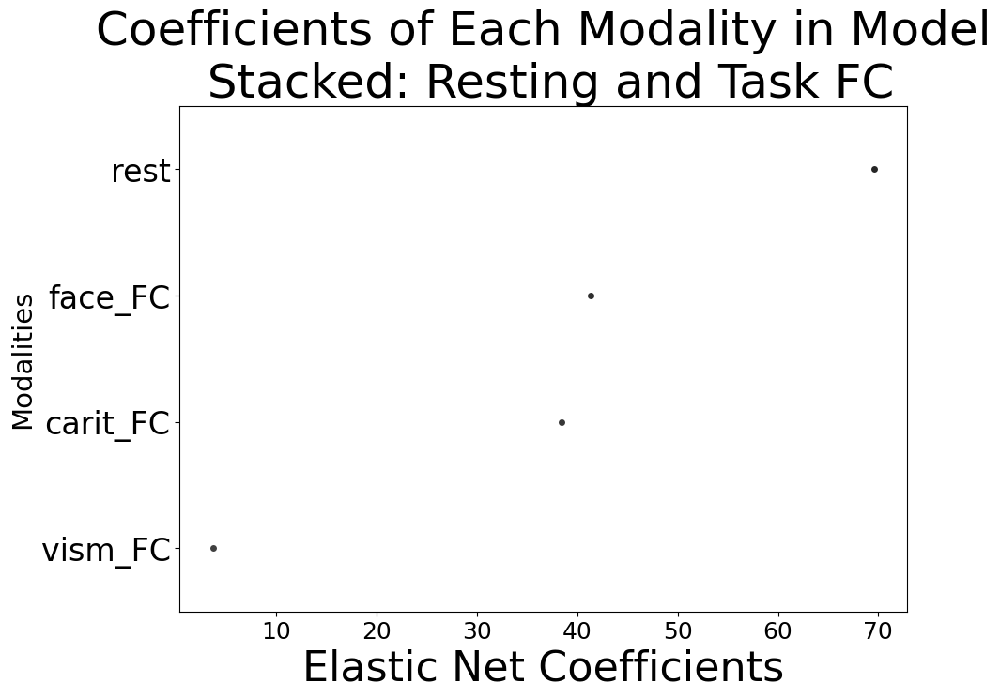

In [12]:
#plot stacked model coeffs 

warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

for key, label in zip(dct_stack_coeff.keys(), lblY[-8:]):
    d=dct_stack_coeff[key].reindex(columns = dct_stack_coeff[key].mean().sort_values(ascending=False).index)

    plt.figure(figsize=(10,7))

    #sns.boxplot(data=d, orient="h")
    sns.swarmplot(data=d, color=".25", orient="h")

    plt.xticks(fontsize=18) 
    plt.yticks(fontsize=24)
    plt.xlabel('Elastic Net Coefficients', fontsize=32)
    plt.ylabel('Modalities', fontsize=21)
    plt.title('Coefficients of Each Modality in Model\n '+label ,fontsize=36)

    plt.show()

In [13]:
###Feature coefficients for stacked modality models

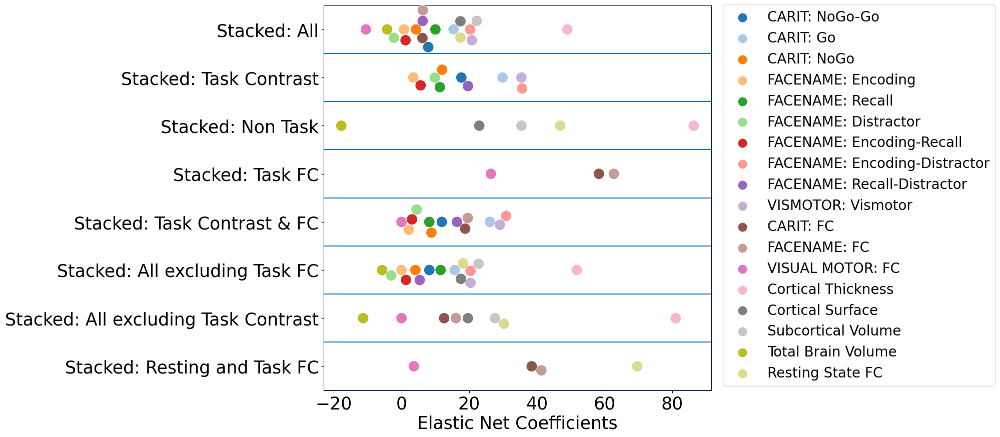

In [14]:
#Plot stacked model coefficients in different way


dct_mean_stack_coef = {}
for key in list(dct_stack_coeff.keys()):
    dct_mean_stack_coef[key] = dct_stack_coeff[key].mean()

df_mean_stack_coef = pd.DataFrame(dct_mean_stack_coef)
df_mean_stack_coef = df_mean_stack_coef.reindex(index = dct_mean_stack_coef['set1'].index)
df_mean_stack_coef.index = lblY[:-8] 
df_mean_stack_coef.columns = lblY[-8:]

#reshape
df_plot_ = pd.DataFrame()
for col in df_mean_stack_coef.columns:
    vct = df_mean_stack_coef[col].values
    ind = df_mean_stack_coef[col].index
    sst = np.full(len(ind), col)
    df__ = pd.DataFrame({'val':vct, 'mod':ind, 'set':sst})
    df_plot_ = pd.concat([df_plot_, df__], axis=0, ignore_index=True)
    
#plot
plt.figure(figsize=(10,10))
sns.swarmplot(data=df_plot_, x='val', y='set', hue='mod', orient="h", 
              palette="tab20", size=15)
for i in np.arange(0.5,8.5,1):
    plt.axhline(y=i)
plt.legend(loc='upper right', bbox_to_anchor=(1.75,1.02), fontsize=20, markerscale=2)
plt.xlabel('Elastic Net Coefficients', fontsize=25)
plt.ylabel('')
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)

plt.savefig(path_img_out+'feat_stack_plot_image.svg',bbox_inches='tight')

df_plot_.to_csv(path2+'table_plot_stack_coeff.csv')

plt.show()

In [14]:
###Feature coefficients for single modality models

In [15]:
#extract feature importance from saved models

#for single modalities (except functional connectivities)


dct_elnet_coeff={}

for file in [i.split('/')[-1] for i in sorted(glob.glob(path2+fold+'/*_elnet_model.sav'))]:
    
    if ('_FC_' not in file) and ('rest' not in file):
        
        dct_ = {}
        #extracting feature importance for each fold each modality
        for fold in folders:
            dct_[fold] = (joblib.load(path2+fold+'/'+file)).named_steps['elasticnet'].coef_
        #assign appropriate indexes
        if file.split('_')[0] in ['carit1','carit3','carit4','face1',
                                  'face2','face3','face4','face5','face6','vism']:
            indxs = ind_task
        elif file.split('_')[0] in ['cort', 'surf']:
            indxs = ind_anat
        elif file.split('_')[0] in ['subc']:
            indxs = ind_subc
        elif file.split('_')[0] in ['VolBrain']:    
            indxs = ind_bVol   
            
        df = pd.DataFrame(dct_ , index=indxs).T 
        #save as csv table
        df.to_csv(path2+file.split('_')[0]+'_elnet_coeffs.csv')
        #save to dictionary
        dct_elnet_coeff[file.split('_')[0]] = df

In [16]:
#extract feature importance from saved models

#for single modalities, only functional connectivities


dct_elnet_FC_coeff={}

for file in [i.split('/')[-1] for i in sorted(glob.glob(path2+fold+'/*_elnet_model.sav'))]:
    
    if ('_FC_' in file) or ('rest'  in file):
        
        dct_ = {}
        #assign appropriate indexes
        indxs = ind_FC
        colsx = np.arange(1,76,1)
        #extracting feature importance for each fold each modality
        for fold in folders:
            #extract PCA values (~71000 of ROI pairs into 75 pc)
            pca_model_ind = np.absolute(((joblib.load(path2+fold+'/PCA_models/PCA_model.sav'))[file.replace("_elnet_model.sav", '')]).components_)
            #extract ElasticNet values for 75 pc
            pc_inx = (joblib.load(path2+fold+'/'+file)).named_steps['elasticnet'].coef_
            #multiply PCA values with ElNet values, and summarize across 75 pc for each ROI pair, for one fold
            dct_[fold] = pd.DataFrame( pca_model_ind.T * pc_inx , index = indxs, columns = colsx).T.sum()  
            
        df = pd.DataFrame(dct_).T
        #save as csv table
        df.to_csv(path2+file.replace("_elnet_model.sav", '')+'_elnet_coeffs.csv')
        #save to dictionary
        dct_elnet_FC_coeff[file.replace("_elnet_model.sav", '')] = df

In [17]:
####Plotting single modality feature importances

In [18]:
dct_elnet_coeff.keys()

dict_keys(['VolBrain', 'carit1', 'carit3', 'carit4', 'cort', 'face1', 'face2', 'face3', 'face4', 'face5', 'face6', 'subc', 'surf', 'vism'])

In [19]:
task_keys = ['carit1', 'carit3', 'carit4', 'face1', 'face2', 'face3', 'face4', 'face5', 'face6', 'vism']
anat_keys = ['cort', 'surf']

In [20]:
for tkey in task_keys:
    print( tkey,min(dct_elnet_coeff[tkey].mean()[:360]), max(dct_elnet_coeff[tkey].mean()[:360]))

carit1 -7.666177509496027 6.877275987658376
carit3 -9.583266143650956 10.949972408881795
carit4 -12.911929276798379 8.085838045972796
face1 -10.856039137175255 9.300798299421428
face2 -8.924021117491696 9.774717717251262
face3 -5.924702392012176 6.637765593183581
face4 -7.183419274493186 5.876128973229545
face5 -22.112076789814477 13.294716027566649
face6 -20.138386632628876 14.725472622718735
vism -6.67253599912772 9.357085433131752


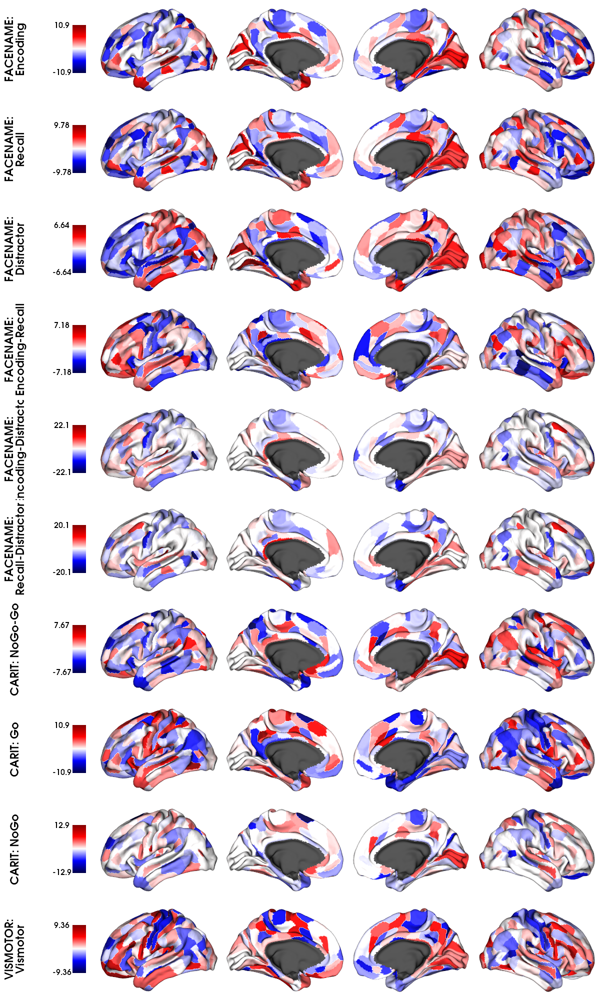

In [21]:
# First load the Glasser annotation file
file_url='https://raw.githubusercontent.com/rcruces/2020_NMA_surface-plot/master/data/glasser_360_conte69.csv'
Glasser = np.loadtxt(urllib2.urlopen(file_url), dtype=int)

# and load the conte69 surfaces
surf_lh, surf_rh = load_conte69()


# Mask the 0-value ROI of the medial wall
mask = Glasser != 0

task_keys = ['face1', 'face2', 'face3', 'face4', 'face5', 'face6','carit1', 'carit3', 'carit4', 'vism']
task_keys_lab = ['FACENAME:\nEncoding',
                 'FACENAME:\nRecall',
                 'FACENAME:\nDistractor',
                 'FACENAME:\nEncoding-Recall',
                 'FACENAME:\nEncoding-Distractor',
                 'FACENAME:\nRecall-Distractor',
                 'CARIT: NoGo-Go',
                 'CARIT: Go',
                 'CARIT: NoGo',
                 'VISMOTOR:\nVismotor']
task = [None] * len(task_keys)

for i, tkey in enumerate(task_keys):
    # add a 0 entry that will match the medial wall index of the final array
    rho = np.concatenate((0, dct_elnet_coeff[tkey].mean()[:360].values), axis=None).round(3)
    # Map the vector values to the vertices indices
    rho_ver = map_to_labels(rho, Glasser, mask=mask,fill=np.nan)
    
    task[i] = rho_ver


"""# Plot  values over the surface
plot_hemispheres(surf_lh, surf_rh,      # Surfaces
                 array_name=task,    # Vector of alues to plot
                 size=(1200, 200*len(task_keys)),       # Size of the output figure
                 #label_text={'left':['random rho']}, # Text and position
                 color_bar='left',#color_bar='top',       # Position of the colorbar
                 cmap='seismic',       # COlormap from matplotlib
                 zoom=1.5,             # zoom on the surface
                 embed_nb=True,         # Embeded this ins inline plot
                 interactive=False,     # Pop-up plot, for embed_nb=True default is False
                 #share='both',          # match to colormap on rows and columns
                 color_range='sym',#(-0.13, 0.13),       # color range
                 nan_color=(0.25, 0.25, 0.25, 1), # nan-color (medial wall) default black
                 background = (1, 1, 1),# Background color, default is white
                 label_text=task_keys_lab,
                 screenshot=True,
                 filename=path_img_out+'feat_single_task_plot_image.svg'
                )
#plt.savefig(path_img_out+'feat_single_task_plot_image.svg',bbox_inches='tight')"""

# Plot  values over the surface
plot_hemispheres(surf_lh, surf_rh,      # Surfaces
                 array_name=task,    # Vector of alues to plot
                 size=(1200, 200*len(task_keys)),       # Size of the output figure
                 #label_text={'left':['random rho']}, # Text and position
                 color_bar='left',#color_bar='top',       # Position of the colorbar
                 cmap='seismic',       # COlormap from matplotlib
                 zoom=1.5,             # zoom on the surface
                 embed_nb=True,         # Embeded this ins inline plot
                 interactive=False,     # Pop-up plot, for embed_nb=True default is False
                 #share='both',          # match to colormap on rows and columns
                 color_range='sym',#(-0.13, 0.13),       # color range
                 nan_color=(0.25, 0.25, 0.25, 1), # nan-color (medial wall) default black
                 background = (1, 1, 1),# Background color, default is white
                 label_text=task_keys_lab,
                 #screenshot=True,
                 #filename=path_img_out+'feat_single_task_plot_image.svg'
                )

face1


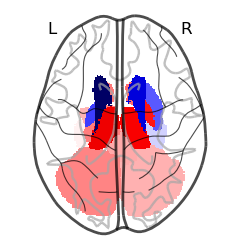

face2


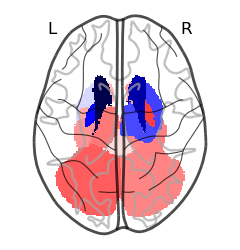

face3


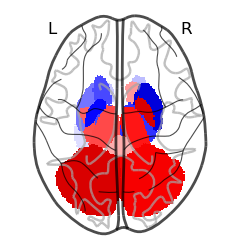

face4


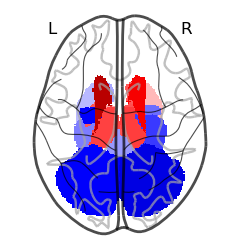

face5


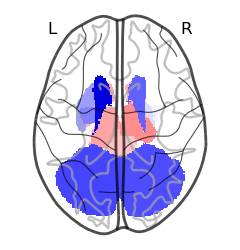

face6


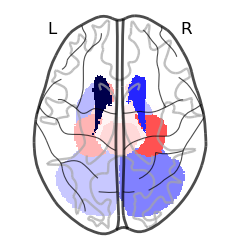

carit1


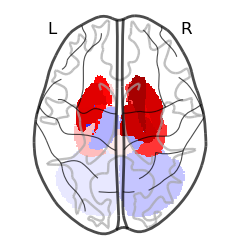

carit3


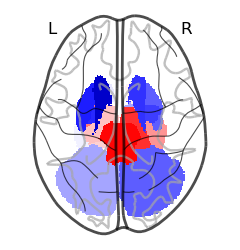

carit4


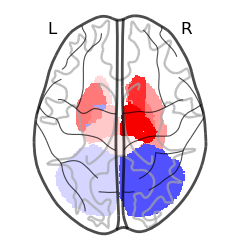

vism


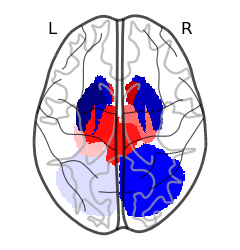

In [22]:
#plot task contrasts on one brain projection, subcortex only

#load atlases
wway = '/media/hcs-psy-narun/Alina/atlases/'
atlas2 = nli.load_img(wway+'subc2.fs.nii.gz')

par_dat2 = atlas2.get_fdata()


for key in ['face1', 'face2','face3','face4','face5','face6','carit1','carit3','carit4','vism']: #contrasts only
    #empty image in the same way as reffered atlas
    site_nii2 = np.zeros(par_dat2.shape)
    #dataframe to plot
    data = dct_elnet_coeff[key]   
    
    #subcortex, the table has same order as atlas
    vec2 = pd.Series((data.mean()[360:]).values, index=pd.read_csv(wway+'atlas_index_num.txt')['nn'].values )

    for index, numb in zip(vec2.index, vec2.iloc[:]): 
        site_nii2[par_dat2 == (index)] = numb
    
    #create image object
    site_img2 = nli.new_img_like(atlas2, site_nii2, atlas2.affine, copy_header=True)
    
    #display
    print(key)
    display2 = plotting.plot_glass_brain(site_img2, plot_abs=False, cmap='seismic',       
                                         colorbar=False, display_mode='z', 
                                         #vmin=min(data.mean()),
                                         #cbar_tick_format = '%.2f',
                                         vmax=round(max(max(data.mean()), abs(min(data.mean()))), 4),
                                         symmetric_cbar=True
                                        )
    
    plt.savefig(path_img_out+'feat_single_task_subc_'+key+'_plot_image.svg',bbox_inches='tight')
    
    plotting.show()

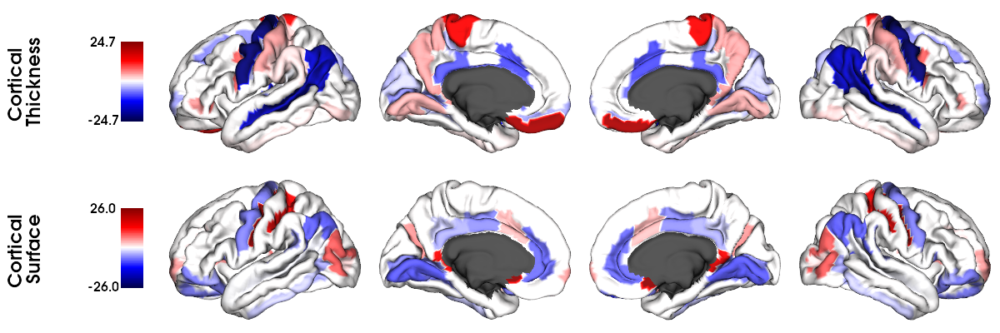

In [23]:
# Fetch surface atlas
destrx = datasets.fetch_atlas_surf_destrieux()

# Load fsaverage5 surfaces
surf_lh, surf_rh = load_fsa5()

# Remove non-cortex regions
regions = destrx['labels'].copy()
masked_regions = [b'Medial_wall', b'Unknown']
masked_labels = [regions.index(r) for r in masked_regions]
for r in masked_regions:
    regions.remove(r)

# Build Destrieux parcellation and mask
labeling = np.concatenate([destrx['map_left'], destrx['map_right']])
mask_destrx = ~np.isin(labeling, masked_labels)


# Map gradients to original parcels
anat_keys = ['cort', 'surf']
anat_keys_lab = ['Cortical \nThickness', 
                 'Cortical \nSurface']
anat = [None] * len(anat_keys)
for i, akey in enumerate(anat_keys):
    rho = map_to_labels(dct_elnet_coeff[akey].mean().values, labeling, mask=mask_destrx, fill=np.nan)
    
    anat[i] = rho

plot_hemispheres(surf_lh, surf_rh, 
                 array_name=anat, 
                 size=(1200, 200*len(anat_keys)), 
                 cmap='seismic',
                 color_bar='left', 
                 zoom=1.5,
                 embed_nb=True,         
                 interactive=False,
                 #share='both',
                 color_range='sym',#(-0.1, 0.1),       # color range
                 nan_color=(0.25, 0.25, 0.25, 1), # nan-color (medial wall) default black
                 background = (1, 1, 1),
                 label_text=anat_keys_lab
                )

subc


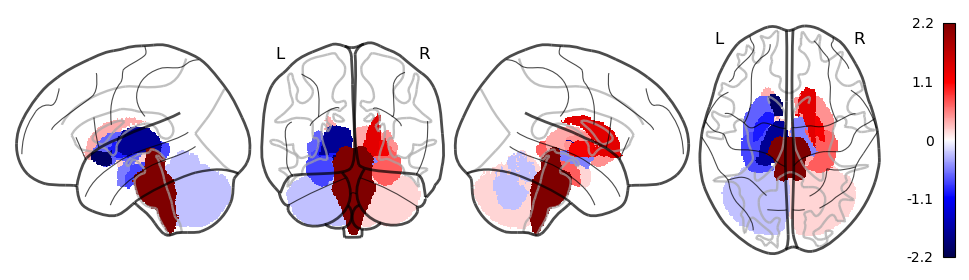

In [24]:
#plot anatomical cortical and subcortical feature importance (from FreeSurfer, Destrieux atlas)
wway = '/media/hcs-psy-narun/Alina/atlases/'
#load atlases
atlas2 = nli.load_img(wway+'subc2.fs.nii.gz')



    
#subcortex

#empty image in the same way as reffered atlas
par_dat2 = atlas2.get_fdata()
site_nii2 = np.zeros(par_dat2.shape)
#reorder subc table into atlas order
dtvc = dct_elnet_coeff['subc']
#std
dtvc = pd.DataFrame(StandardScaler().fit_transform(dtvc.T.values),
                    index=dtvc.T.index, columns=dtvc.T.columns).T
v2 = dtvc.mean()
vec2 =pd.Series(v2.values, index=pd.read_csv(wway+'atlas_index_num.txt')['nn'].values )
#fill mat with numbers
for index, numb in zip(vec2.index, vec2.iloc[:]): 
    site_nii2[par_dat2 == (index)] = numb
#create image object
site_img2 = nli.new_img_like(atlas2, site_nii2, atlas2.affine, copy_header=True)
#display
print('subc')
display_subc = plotting.plot_glass_brain(site_img2, plot_abs=False, cmap='seismic',  #different colormap
                                         colorbar=True, display_mode='lyrz', 
                                         symmetric_cbar=True)

plt.savefig(path_img_out+'feat_single_struct_subc_plot_image.svg',bbox_inches='tight')

plotting.show()

In [25]:
dct_elnet_coeff['VolBrain'].columns


Index(['FS_IntraCranial_Vol', 'FS_TotCort_GM_Vol', 'FS_SubCort_GM_Vol',
       'FS_Tot_WM_Vol', 'FS_BrainSegVol_eTIV_Ratio'],
      dtype='object')

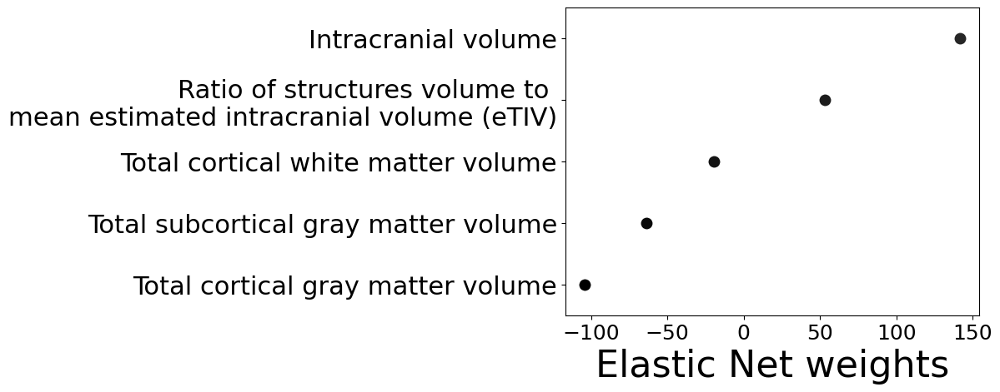

In [26]:
#Total Brain Volume

data = dct_elnet_coeff['VolBrain']
data.columns = ['Intracranial volume',
'Total cortical gray matter volume',
'Total subcortical gray matter volume',
'Total cortical white matter volume',
'Ratio of structures volume to \nmean estimated intracranial volume (eTIV)']

#data = pd.DataFrame(StandardScaler().fit_transform(data.T.values), 
#                    index=data.T.index, columns=data.T.columns).T

data = data.loc[:, data.mean().sort_values(ascending=False).index]
data.T.to_csv(path2+'TBV_plot_numbers.csv')
#sns.boxplot(data=data, orient="h", color='tab:blue')
sns.swarmplot(data=data, color="black", orient="h", size=10)

plt.xticks(fontsize=18)
plt.yticks(fontsize=22)
#plt.xlim((-0.07,0.2))
#plt.xlabel('', fontsize=21)
plt.xlabel('Elastic Net weights', fontsize=32)
#plt.title('Coefficients of Each Feature in\nthe Total Brain Volume Modality\n',fontsize=36)

plt.savefig(path_img_out+'feat_single_TotalVolume_plot_image.svg',bbox_inches='tight')

plt.show()

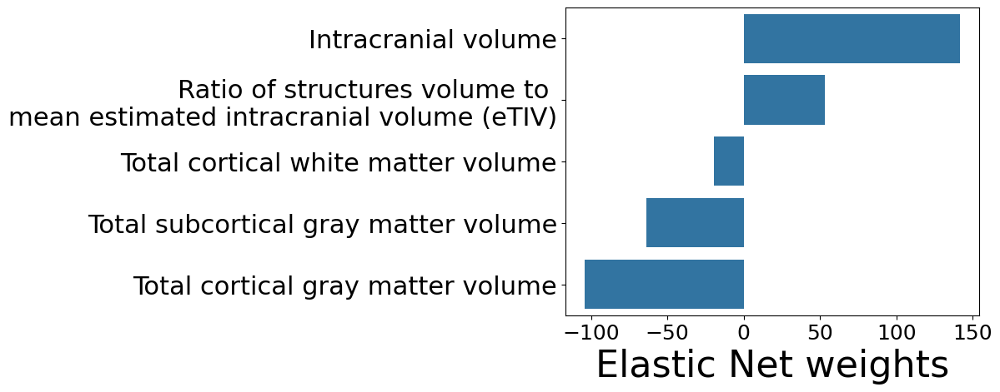

In [27]:
#Total Brain Volume

data = dct_elnet_coeff['VolBrain']
data.columns = ['Intracranial volume',
'Total cortical gray matter volume',
'Total subcortical gray matter volume',
'Total cortical white matter volume',
'Ratio of structures volume to \nmean estimated intracranial volume (eTIV)']

#data = pd.DataFrame(StandardScaler().fit_transform(data.T.values), 
#                    index=data.T.index, columns=data.T.columns).T

data = data.loc[:, data.mean().sort_values(ascending=False).index]
data.T.to_csv(path2+'TBV_plot_numbers.csv')
sns.barplot(data=data, orient="h", color='tab:blue')
#sns.swarmplot(data=data, color="black", orient="h", size=10)

plt.xticks(fontsize=18)
plt.yticks(fontsize=22)
#plt.xlim((-0.07,0.2))
#plt.xlabel('', fontsize=21)
plt.xlabel('Elastic Net weights', fontsize=32)
#plt.title('Coefficients of Each Feature in\nthe Total Brain Volume Modality\n',fontsize=36)

plt.savefig(path_img_out+'feat_single_TotalVolume_plot_image2.svg',bbox_inches='tight')

plt.show()

In [28]:
dct_elnet_FC_coeff.keys()

dict_keys(['carit_FC', 'face_FC', 'rest', 'vism_FC'])

#### Resting State and Tasks FC

In [29]:
#reorganize from pairs of ROIs back to matrix format

dct_FC_mat = {}
for key in ['rest', 'face_FC', 'vism_FC', 'carit_FC']:
    #dataframe to convert
    data_i  = dct_elnet_FC_coeff[key]

    df_std_FC = pd.DataFrame()
    #standardize
    for indx in data_i.index:
        df_std_FC[indx] = pd.DataFrame(StandardScaler().fit_transform(data_i.loc[indx,:].values.reshape(-1, 1)), 
                                       index=data_i.loc[indx,:].index)[0]
    df_std_FC = df_std_FC.T
    
    #average across folds    
    data = df_std_FC.mean()

    #restore full matrix
    ind379 = np.triu_indices(379, k=1)
    mat379 = np.zeros((379,379),float)
    mat379[ind379]=data.values
    mat379_2 = pd.DataFrame(mat379).replace(0, np.nan)
    mat379_f = pd.DataFrame(np.where(mat379,mat379_2,mat379_2.T))
    mat379_f.index = ind_task
    mat379_f.columns = ind_task
    
    #save mat to dct
    dct_FC_mat[key] = mat379_f

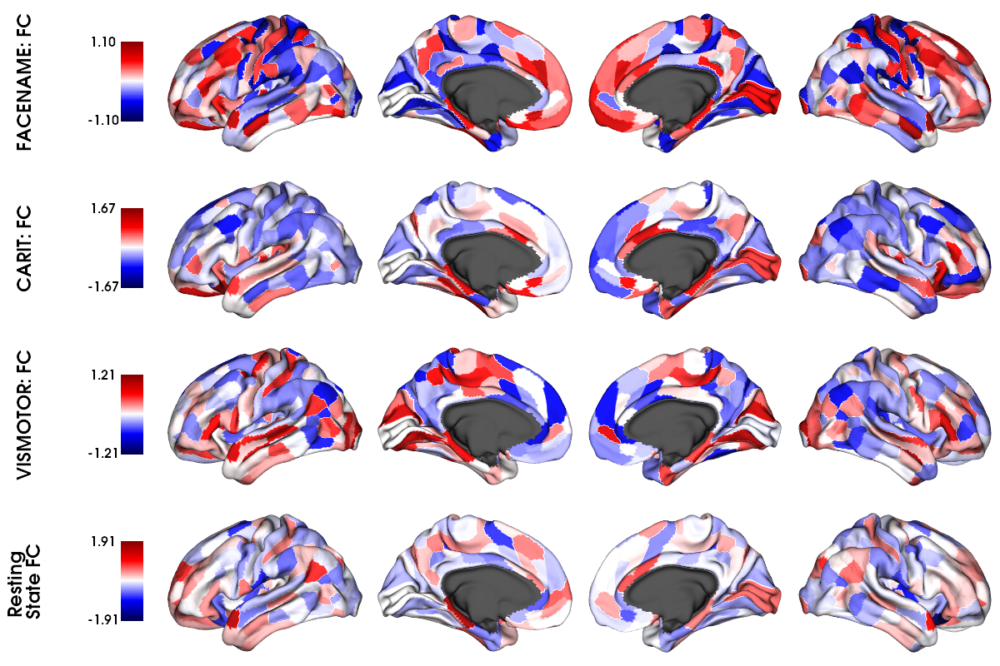

In [30]:
# First load the Glasser annotation file
file_url='https://raw.githubusercontent.com/rcruces/2020_NMA_surface-plot/master/data/glasser_360_conte69.csv'
Glasser = np.loadtxt(urllib2.urlopen(file_url), dtype=int)

# and load the conte69 surfaces
surf_lh, surf_rh = load_conte69()


# Mask the 0-value ROI of the medial wall
mask = Glasser != 0

fc_keys = ['face_FC', 'carit_FC', 'vism_FC', 'rest']
fc_keys_lab = ['FACENAME: FC',
               'CARIT: FC',
               'VISMOTOR: FC',
               'Resting \nState FC',]
fc = [None] * len(fc_keys)

for i, fkey in enumerate(fc_keys):
    # add a 0 entry that will match the medial wall index of the final array
    rho = np.concatenate((0, dct_FC_mat[fkey].mean()[:360].values), axis=None)
    # Map the vector values to the vertices indices
    rho_ver = map_to_labels(rho, Glasser, mask=mask,fill=np.nan)
    
    fc[i] = rho_ver


# Plot  values over the surface
plot_hemispheres(surf_lh, surf_rh,      # Surfaces
                 array_name=fc,    # Vector of alues to plot
                 size=(1200, 200*len(fc_keys)),       # Size of the output figure
                 #label_text={'left':['random rho']}, # Text and position
                 color_bar='left',#color_bar='top',       # Position of the colorbar
                 cmap='seismic',       # COlormap from matplotlib
                 zoom=1.5,             # zoom on the surface
                 embed_nb=True,         # Embeded this ins inline plot
                 interactive=False,     # Pop-up plot, for embed_nb=True default is False
                 #share='both',          # match to colormap on rows and columns
                 color_range='sym',#(-0.13, 0.13),       # color range
                 nan_color=(0.25, 0.25, 0.25, 1), # nan-color (medial wall) default black
                 background = (1, 1, 1),# Background color, default is white
                 label_text=fc_keys_lab
                )



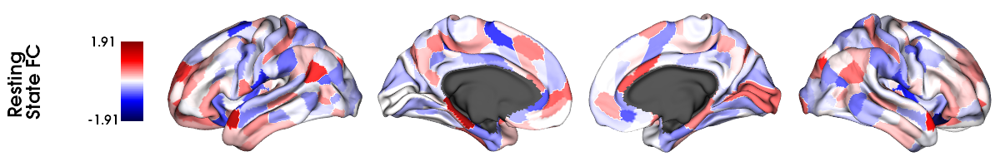

In [31]:
# First load the Glasser annotation file
file_url='https://raw.githubusercontent.com/rcruces/2020_NMA_surface-plot/master/data/glasser_360_conte69.csv'
Glasser = np.loadtxt(urllib2.urlopen(file_url), dtype=int)

# and load the conte69 surfaces
surf_lh, surf_rh = load_conte69()


# Mask the 0-value ROI of the medial wall
mask = Glasser != 0

fc_keys = ['rest']#, 'face_FC', 'vism_FC', 'carit_FC']
fc_keys_lab = ['Resting \nState FC',]
               #'FACENAME: FC',
               #'VISMOTOR: FC',
               #'CARIT: FC',]
fc = [None] * len(fc_keys)

for i, fkey in enumerate(fc_keys):
    # add a 0 entry that will match the medial wall index of the final array
    rho = np.concatenate((0, dct_FC_mat[fkey].mean()[:360].values), axis=None)
    # Map the vector values to the vertices indices
    rho_ver = map_to_labels(rho, Glasser, mask=mask,fill=np.nan)
    
    fc[i] = rho_ver


# Plot  values over the surface
plot_hemispheres(surf_lh, surf_rh,      # Surfaces
                 array_name=fc,    # Vector of alues to plot
                 size=(1200, 200*len(fc_keys)),       # Size of the output figure
                 #label_text={'left':['random rho']}, # Text and position
                 color_bar='left',#color_bar='top',       # Position of the colorbar
                 cmap='seismic',       # COlormap from matplotlib
                 zoom=1.5,             # zoom on the surface
                 embed_nb=True,         # Embeded this ins inline plot
                 interactive=False,     # Pop-up plot, for embed_nb=True default is False
                 #share='both',          # match to colormap on rows and columns
                 color_range='sym',#(-0.13, 0.13),       # color range
                 nan_color=(0.25, 0.25, 0.25, 1), # nan-color (medial wall) default black
                 background = (1, 1, 1),# Background color, default is white
                 label_text=fc_keys_lab
                )



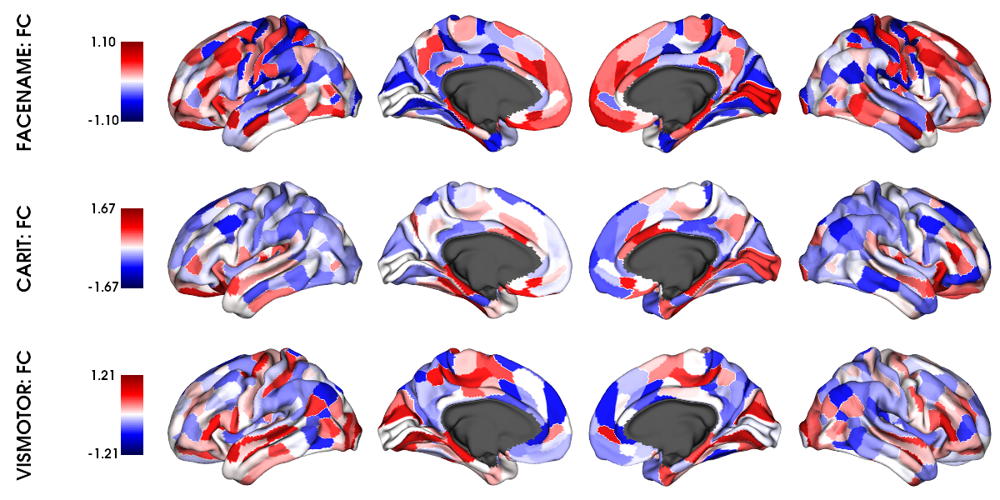

In [32]:
# First load the Glasser annotation file
file_url='https://raw.githubusercontent.com/rcruces/2020_NMA_surface-plot/master/data/glasser_360_conte69.csv'
Glasser = np.loadtxt(urllib2.urlopen(file_url), dtype=int)

# and load the conte69 surfaces
surf_lh, surf_rh = load_conte69()


# Mask the 0-value ROI of the medial wall
mask = Glasser != 0

fc_keys = ['face_FC', 'carit_FC', 'vism_FC'] #'rest', 
fc_keys_lab = [#'Resting \nState FC',
               'FACENAME: FC',
               'CARIT: FC',
               'VISMOTOR: FC',]
fc = [None] * len(fc_keys)

for i, fkey in enumerate(fc_keys):
    # add a 0 entry that will match the medial wall index of the final array
    rho = np.concatenate((0, dct_FC_mat[fkey].mean()[:360].values), axis=None)
    # Map the vector values to the vertices indices
    rho_ver = map_to_labels(rho, Glasser, mask=mask,fill=np.nan)
    
    fc[i] = rho_ver


# Plot  values over the surface
plot_hemispheres(surf_lh, surf_rh,      # Surfaces
                 array_name=fc,    # Vector of alues to plot
                 size=(1200, 200*len(fc_keys)),       # Size of the output figure
                 #label_text={'left':['random rho']}, # Text and position
                 color_bar='left',#color_bar='top',       # Position of the colorbar
                 cmap='seismic',       # COlormap from matplotlib
                 zoom=1.5,             # zoom on the surface
                 embed_nb=True,         # Embeded this ins inline plot
                 interactive=False,     # Pop-up plot, for embed_nb=True default is False
                 #share='both',          # match to colormap on rows and columns
                 color_range='sym',#(-0.13, 0.13),       # color range
                 nan_color=(0.25, 0.25, 0.25, 1), # nan-color (medial wall) default black
                 background = (1, 1, 1),# Background color, default is white
                 label_text=fc_keys_lab
                )



rest


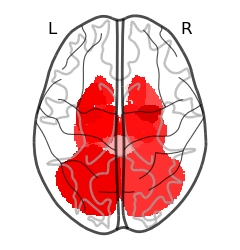

face_FC


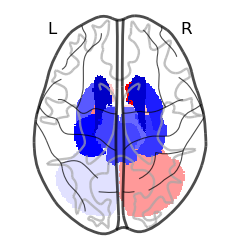

vism_FC


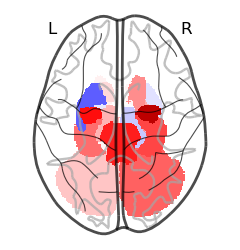

carit_FC


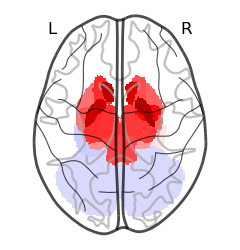

In [33]:
#plot task contrasts on one brain projection, subcortex only

#load atlases
wway = '/media/hcs-psy-narun/Alina/atlases/'
atlas2 = nli.load_img(wway+'subc2.fs.nii.gz')

par_dat2 = atlas2.get_fdata()


for key in ['rest', 'face_FC', 'vism_FC', 'carit_FC']: #contrasts only
    #empty image in the same way as reffered atlas
    site_nii2 = np.zeros(par_dat2.shape)
    #dataframe to plot
    data = dct_FC_mat[key]   
    
    #subcortex, the table has same order as atlas
    vec2 = pd.Series((data.mean()[360:]).values, index=pd.read_csv(wway+'atlas_index_num.txt')['nn'].values )

    for index, numb in zip(vec2.index, vec2.iloc[:]): 
        site_nii2[par_dat2 == (index)] = numb
    
    #create image object
    site_img2 = nli.new_img_like(atlas2, site_nii2, atlas2.affine, copy_header=True)
    
    #display
    print(key)
    display2 = plotting.plot_glass_brain(site_img2, plot_abs=False, cmap='seismic',       
                                         colorbar=False, display_mode='z', 
                                         #vmin=min(data.mean()), 
                                         vmax=round(max(max(data.mean()), abs(min(data.mean()))), 4),
                                         symmetric_cbar=True
                                        )
    
    plt.savefig(path_img_out+'feat_single_FCs_subc_'+key+'_plot_image.svg',bbox_inches='tight')
    
    plotting.show()

In [34]:
glanets = pd.read_csv('/media/hcs-psy-narun/Alina/atlases/Glasser-Cole_match_table.txt')

In [35]:
tab_subc = pd.DataFrame({'orig_order':np.arange(361,380,1),
                         'left_first_order':np.arange(361,380,1),
                         'Cole_net_order':np.full(19,13),
                         'name_Glasser':ind_task[-19:],
                         'Cole_net_name':np.full(19,'Subcortex')
                         }, index=np.arange(360,379,1))

In [36]:
glanets = pd.concat([glanets,tab_subc], axis=0)

In [37]:
vec = []
vec_nms = []
k=0
for i in sorted(set(glanets['Cole_net_order'])):
    #print(i)
    display()
    k+= int(len(glanets[glanets['Cole_net_order']==i].index))
    vec+=[k]
    nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
    vec_nms+= [nms]

In [38]:
for key in ['rest', 'face_FC', 'vism_FC', 'carit_FC']:
    print(key)
    print('max', dct_FC_mat[key].max().max())
    print('min', dct_FC_mat[key].min().min())

rest
max 4.492318915266913
min -3.671250328065021
face_FC
max 3.9995094750222493
min -3.929062252171418
vism_FC
max 4.496660182921491
min -3.753860926215578
carit_FC
max 3.6079269604519375
min -4.326847319637282


rest


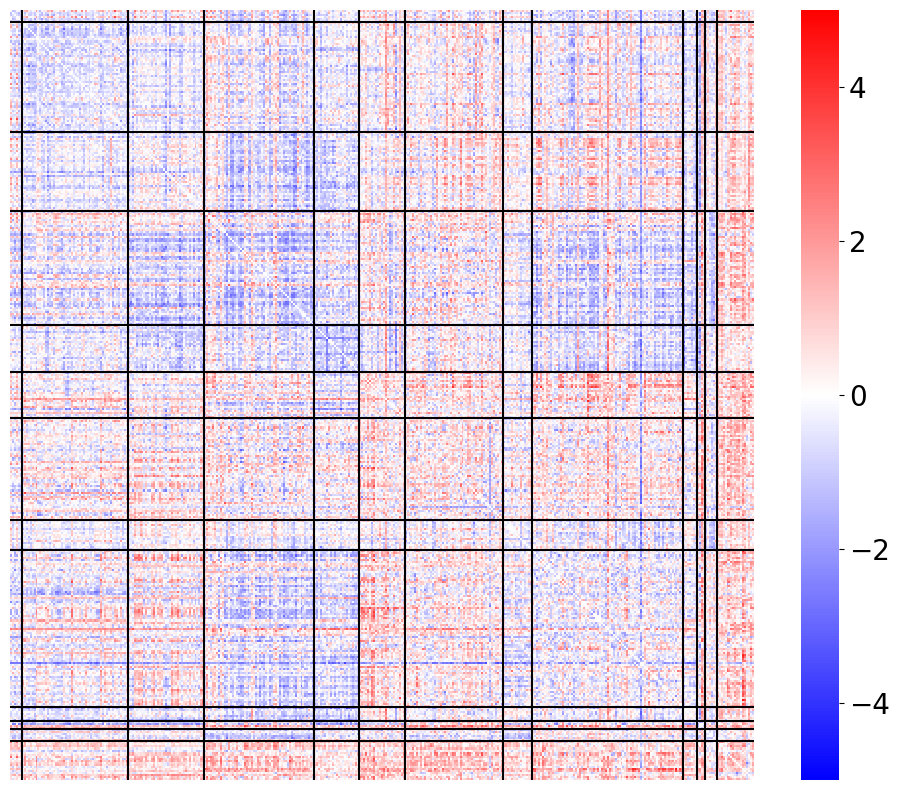

face_FC


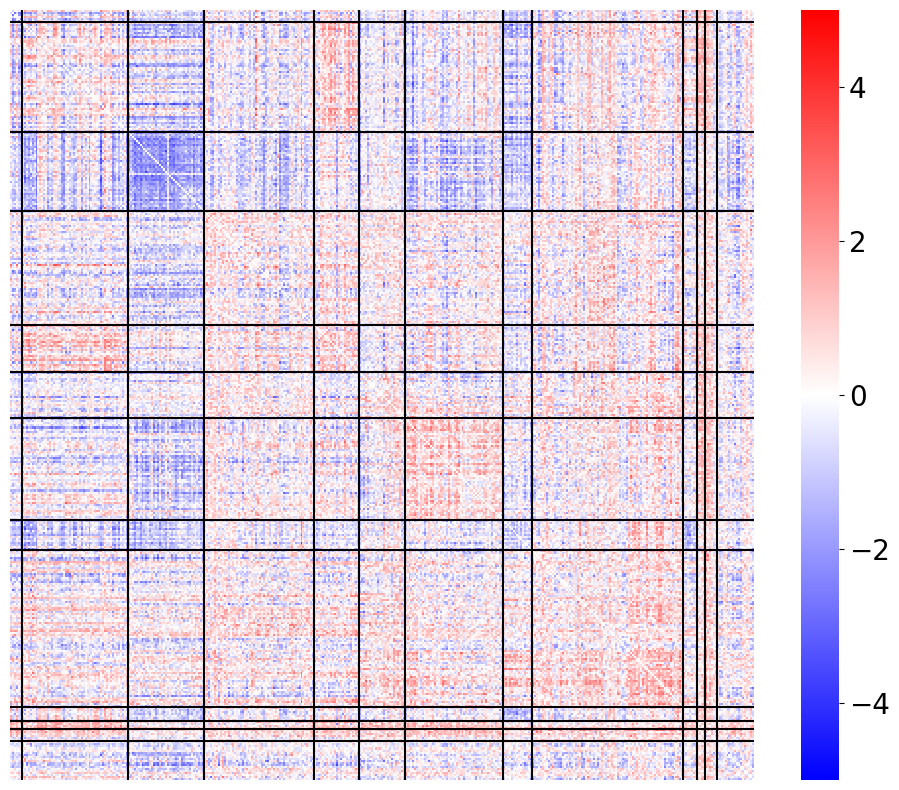

vism_FC


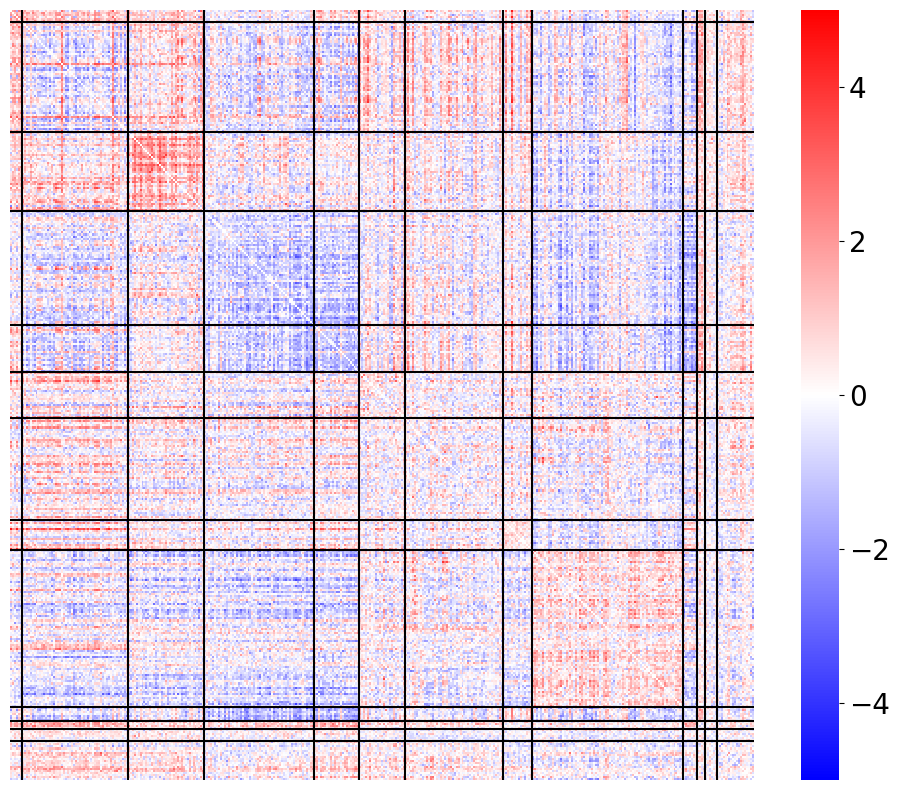

carit_FC


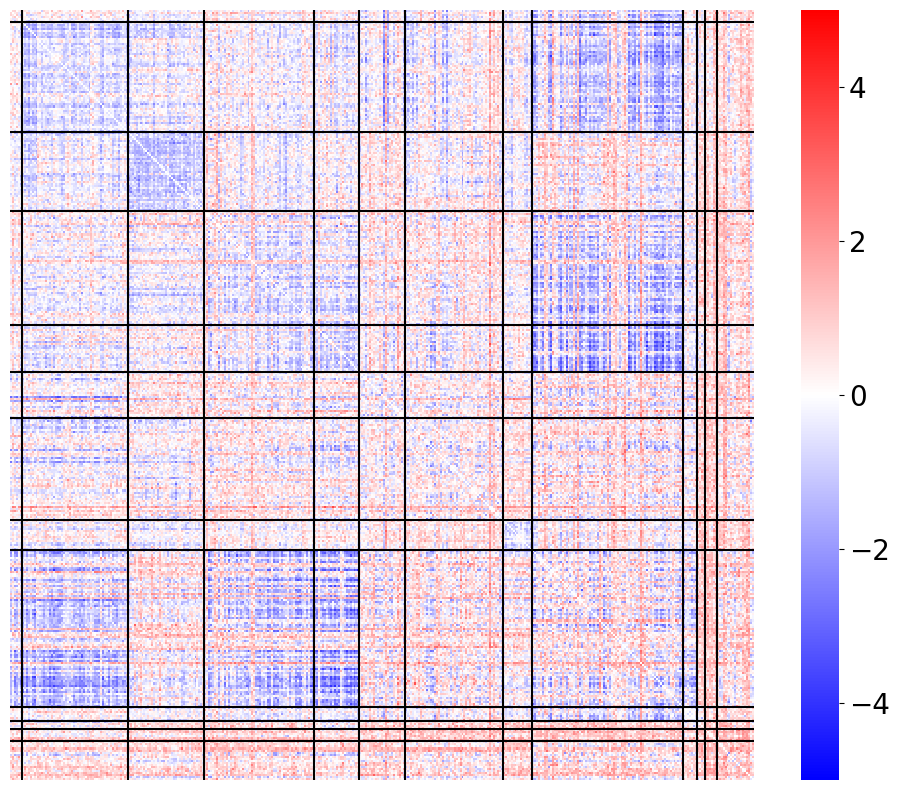

In [39]:
for key in ['rest', 'face_FC', 'vism_FC', 'carit_FC']:
    print(key)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values
    data = dct_FC_mat[key].reindex(index=indx, columns=indx)

    fig= plt.figure(figsize=(12,10))

    ax =sns.heatmap(data=data, cmap='bwr',vmin=-5, vmax=5)
    plt.xticks([])
    plt.yticks([])

    vec = []
    vec_nms = []
    k=0
    for i in sorted(set(glanets['Cole_net_order'])):
        #print(i)
        display()
        k+= int(len(glanets[glanets['Cole_net_order']==i].index))
        vec+=[k]
        nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
        vec_nms+= [nms]

    for k in vec[:-1]:
        plt.axvline(x=k, color='black')
        plt.axhline(y=k, color='black')

    # use matplotlib.colorbar.Colorbar object
    cbar = ax.collections[0].colorbar
    # here set the labelsize by 20
    cbar.ax.tick_params(labelsize=20)

    plt.savefig(path_img_out+'FI_Brain_NoAdj_FCs_'+key+'_1_plot_image.svg',bbox_inches='tight')

    plt.show()

rest


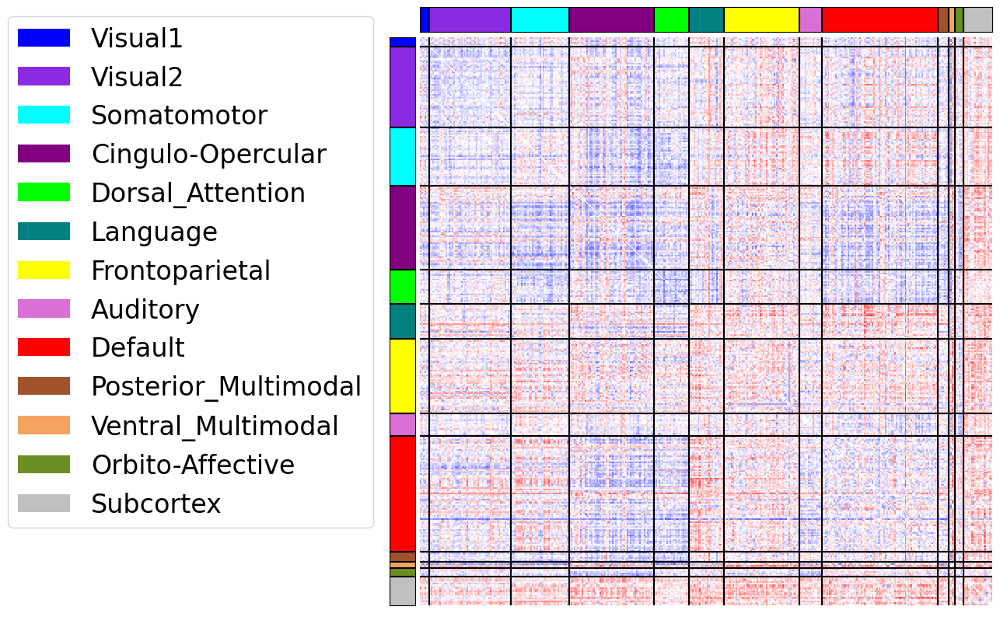

face_FC


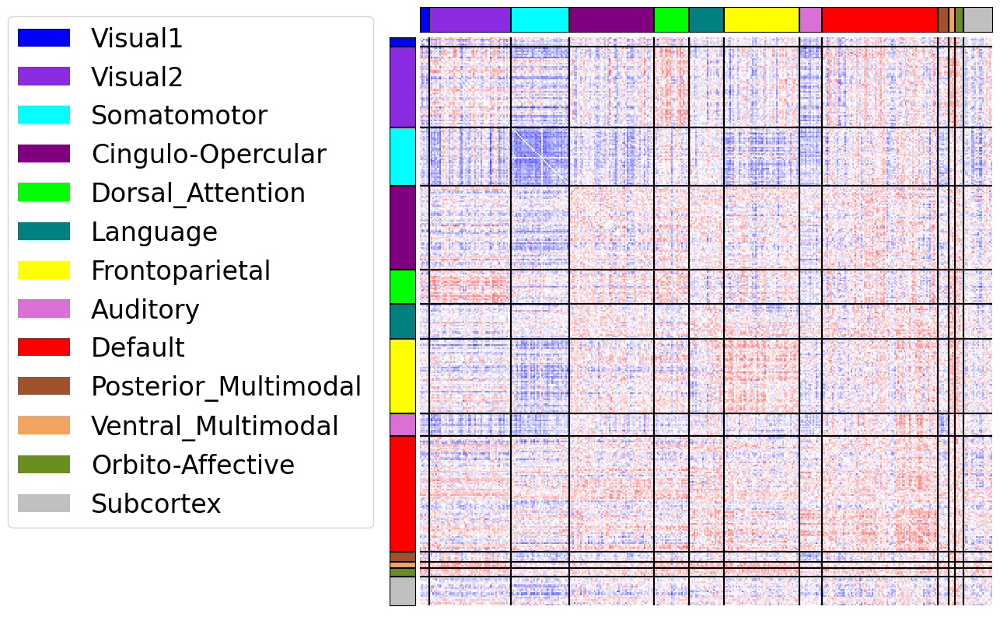

vism_FC


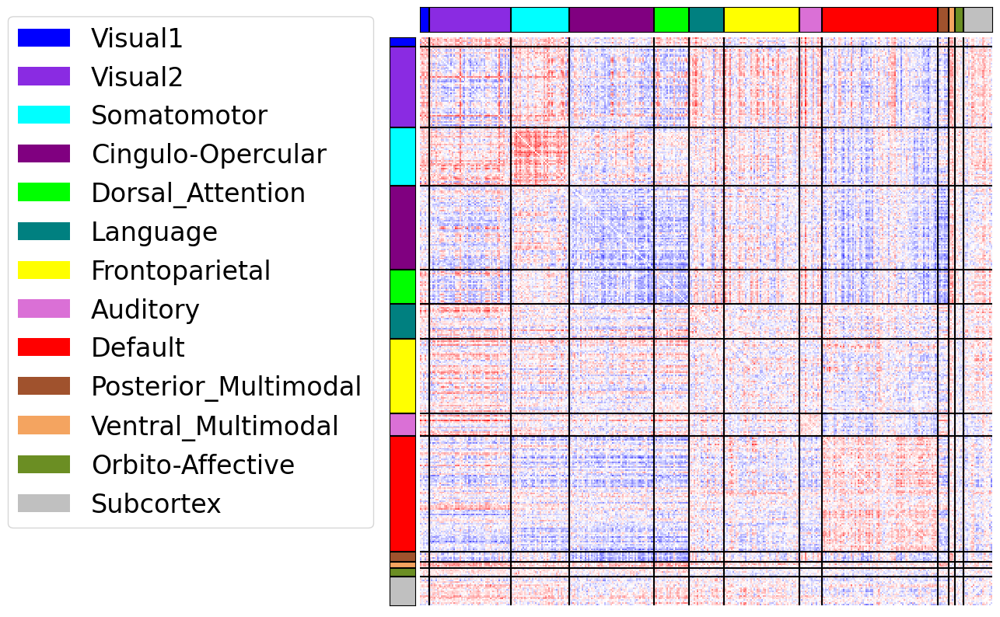

carit_FC


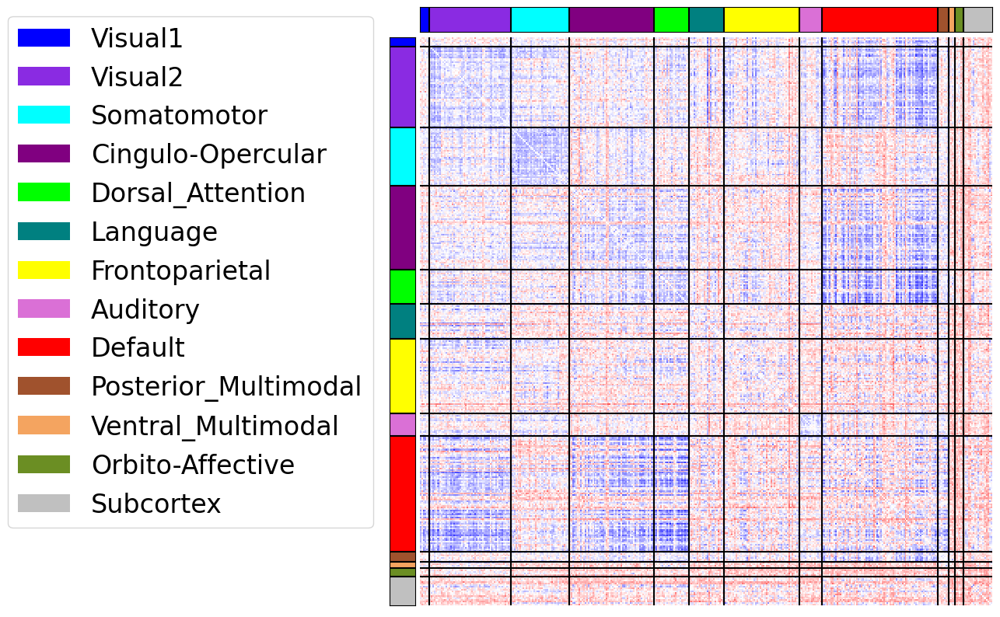

In [40]:
for key in ['rest', 'face_FC', 'vism_FC', 'carit_FC']:
    print(key)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values

    data = dct_FC_mat[key].reindex(index=indx, columns=indx)


    fig= plt.figure(figsize=(10,10))

    ax1 = plt.subplot2grid((20, 20), (0, 1), colspan=19) #x, horizontal
    ax2 = plt.subplot2grid((20, 20), (1, 0), rowspan=19) #y, vertical
    ax3 = plt.subplot2grid((20, 20), (1, 1), rowspan=19, colspan=19, sharex=ax1, sharey=ax2)


    vec = []
    vec_nms = []
    k=0
    for i in sorted(set(glanets['Cole_net_order'])):
        #print(i)
        display()
        k+= int(len(glanets[glanets['Cole_net_order']==i].index))
        vec+=[k]
        nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
        vec_nms+= [nms]


    for k in vec[:-1]:
        ax1.axvline(x=k, color='black')
        ax2.axhline(y=k, color='black')
        ax3.axvline(x=k, color='black')
        ax3.axhline(y=k, color='black')

    clrss = ['blue', 'blueviolet', 'cyan', 'purple', 'lime', 'teal', 'yellow', 'orchid', 'red', 'sienna', 'sandybrown', 'olivedrab', 'silver']    
    #clrss = clrss[::-1]
    lblss = vec_nms

    for n in range(len(vec)):
        if n==0:
            xmin=0
            xmax=vec[n]
        else:
            xmin=vec[n-1]
            xmax=vec[n]

        ax1.axvspan(xmin=xmin, xmax = xmax, ymax=1, facecolor=clrss[n], label=lblss[n])
        ax2.axhspan(ymin=xmin, ymax = xmax, xmax=1, facecolor=clrss[n])

    ax3 = sns.heatmap(data=data, cmap='bwr',vmin=-5, vmax=5,  cbar=False)#square=True,
    ax3.set_xticks([])
    ax3.set_yticks([])   

    ax1.set_ylim((0,0.5))
    ax2.set_xlim((0,0.5))
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax2.set_xticks([])
    ax2.set_yticks([])

    fig.legend(bbox_to_anchor=(0.12,0.885), fontsize=24)
    #ax2.legend(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(cm.ScalarMappable(cmap='inferno'), ax=axs[10:12])

    plt.savefig(path_img_out+'FI_Brain_NoAdj_FCs_'+key+'_2_plot_image.svg',bbox_inches='tight')

    plt.show()

rest


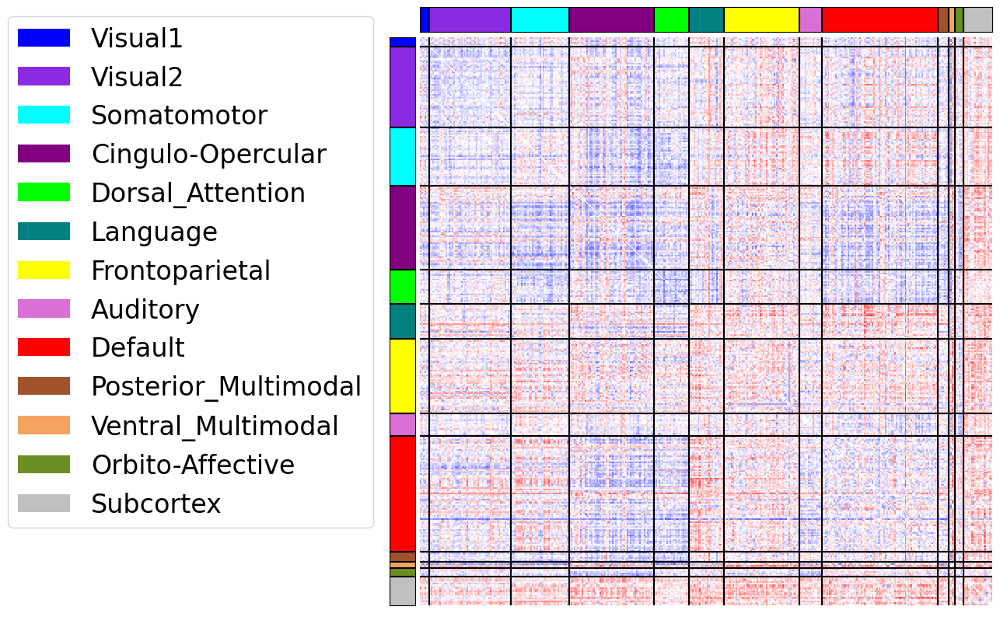

face_FC


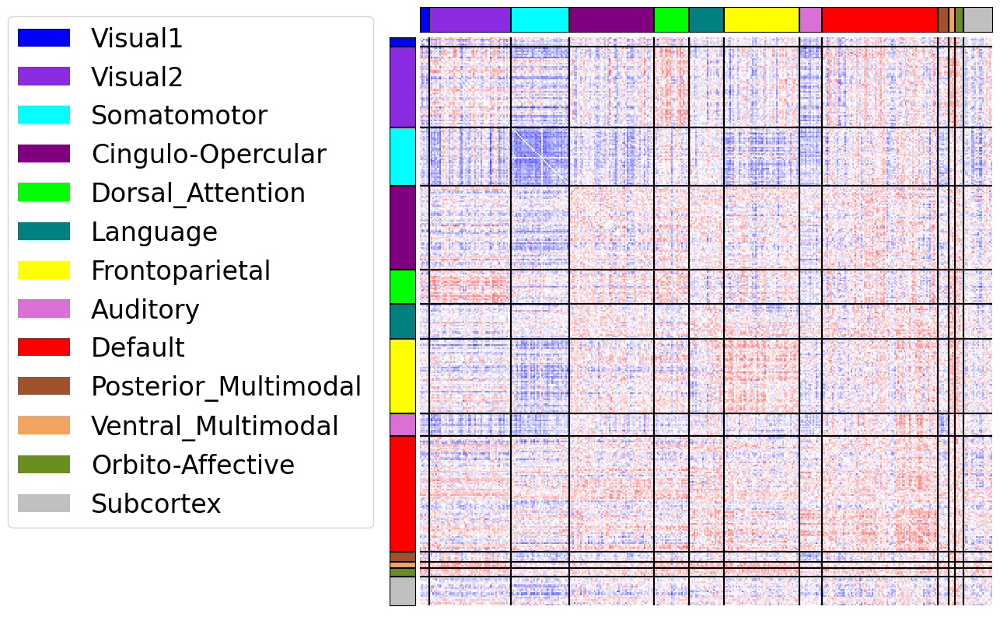

vism_FC


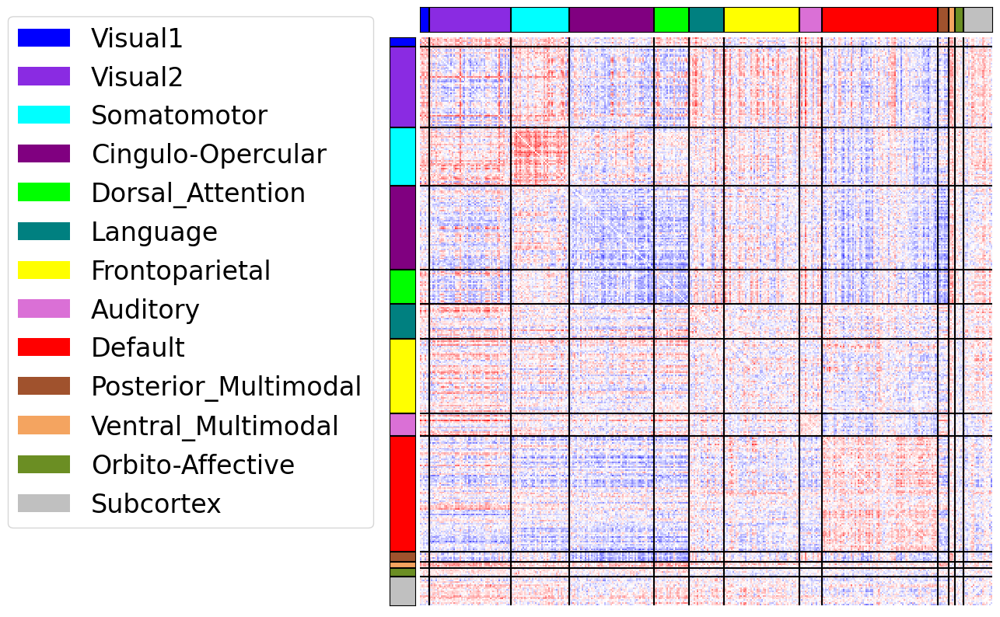

carit_FC


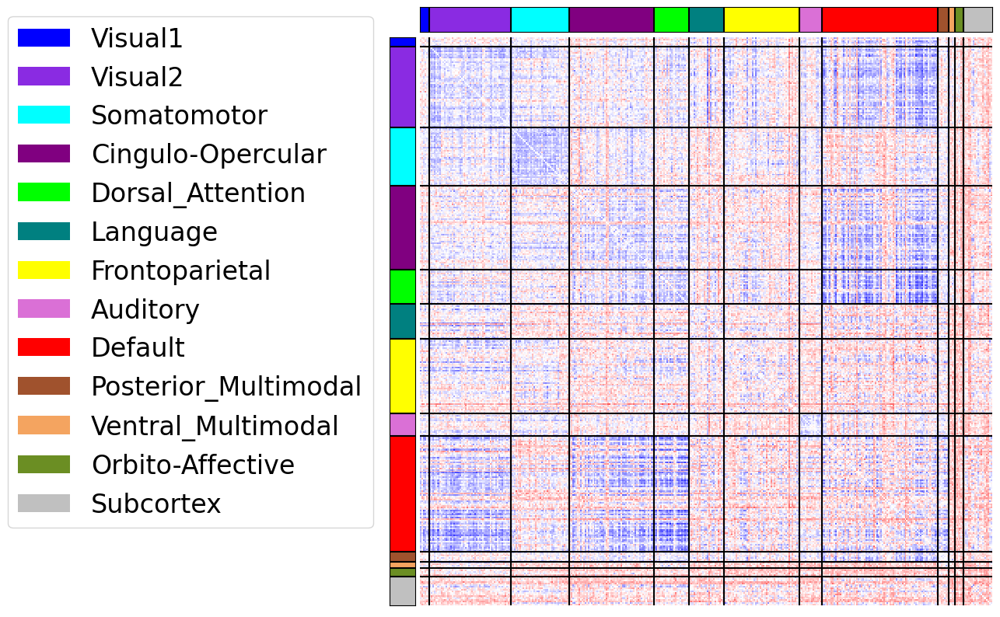

In [43]:
for key in ['rest', 'face_FC', 'vism_FC', 'carit_FC']:
    print(key)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values

    data = dct_FC_mat[key].reindex(index=indx, columns=indx)


    fig= plt.figure(figsize=(10,10))

    ax1 = plt.subplot2grid((20, 20), (0, 1), colspan=19) #x, horizontal
    ax2 = plt.subplot2grid((20, 20), (1, 0), rowspan=19) #y, vertical
    ax3 = plt.subplot2grid((20, 20), (1, 1), rowspan=19, colspan=19, sharex=ax1, sharey=ax2)


    vec = []
    vec_nms = []
    k=0
    for i in sorted(set(glanets['Cole_net_order'])):
        #print(i)
        display()
        k+= int(len(glanets[glanets['Cole_net_order']==i].index))
        vec+=[k]
        nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
        vec_nms+= [nms]


    for k in vec[:-1]:
        ax1.axvline(x=k, color='black')
        ax2.axhline(y=k, color='black')
        ax3.axvline(x=k, color='black')
        ax3.axhline(y=k, color='black')

    clrss = ['blue', 'blueviolet', 'cyan', 'purple', 'lime', 'teal', 'yellow', 'orchid', 'red', 'sienna', 'sandybrown', 'olivedrab', 'silver']    
    #clrss = clrss[::-1]
    lblss = vec_nms

    for n in range(len(vec)):
        if n==0:
            xmin=0
            xmax=vec[n]
        else:
            xmin=vec[n-1]
            xmax=vec[n]

        ax1.axvspan(xmin=xmin, xmax = xmax, ymax=1, facecolor=clrss[n], label=lblss[n])
        ax2.axhspan(ymin=xmin, ymax = xmax, xmax=1, facecolor=clrss[n])

    ax3 = sns.heatmap(data=data, cmap='bwr',vmin=-5, vmax=5,  cbar=False)#square=True,
    ax3.set_xticks([])
    ax3.set_yticks([])   

    ax1.set_ylim((0,0.5))
    ax2.set_xlim((0,0.5))
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax2.set_xticks([])
    ax2.set_yticks([])

    fig.legend(bbox_to_anchor=(0.12,0.885), fontsize=24)
    #ax2.legend(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(cm.ScalarMappable(cmap='inferno'), ax=axs[10:12])

    plt.savefig(path_img_out+'FI2_Brain_NoAdj_FCs_'+key+'_2_plot_image.png',bbox_inches='tight')

    plt.show()

In [42]:
for key in ['rest', 'face_FC', 'vism_FC', 'carit_FC']:
    print(key)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values

    data = dct_FC_mat[key].reindex(index=indx, columns=indx)
    
    net_icc = {}
    for i in sorted(set(glanets['Cole_net_name'])):
        indxs = glanets[glanets['Cole_net_name']==i]['name_Glasser'].values
        df= data.reindex(index=indxs, columns=indxs)
        df = df.where(np.triu(np.ones(df.shape)).astype(np.bool))
        df = df.stack().reset_index()
        df.columns = ['Row','Column','Value']
        net_icc[i] = df['Value'].mean()
    net_icc = pd.Series(net_icc)
    #print(key)
    display(net_icc.sort_values(ascending=False))

rest


Subcortex               0.737728
Language                0.447174
Frontoparietal          0.239077
Somatomotor            -0.024236
Posterior_Multimodal   -0.029532
Default                -0.135501
Auditory               -0.316750
Orbito-Affective       -0.448678
Cingulo-Opercular      -0.529734
Visual2                -0.531433
Ventral_Multimodal     -0.697026
Visual1                -0.756639
Dorsal_Attention       -1.079221
dtype: float64

face_FC


Frontoparietal          0.708586
Dorsal_Attention        0.674546
Default                 0.515474
Ventral_Multimodal      0.388258
Orbito-Affective        0.365292
Language                0.352772
Cingulo-Opercular       0.140675
Visual2                 0.132460
Subcortex              -0.243558
Posterior_Multimodal   -0.298523
Auditory               -0.821141
Visual1                -1.068213
Somatomotor            -1.741816
dtype: float64

vism_FC


Visual1                 1.447126
Somatomotor             1.354857
Default                 0.582535
Auditory                0.537126
Language                0.350776
Frontoparietal          0.054917
Subcortex              -0.004157
Visual2                -0.180916
Ventral_Multimodal     -0.219737
Orbito-Affective       -0.311212
Posterior_Multimodal   -0.671530
Cingulo-Opercular      -0.846918
Dorsal_Attention       -1.023246
dtype: float64

carit_FC


Orbito-Affective        1.143228
Subcortex               0.948466
Ventral_Multimodal      0.404400
Visual1                 0.238865
Frontoparietal          0.139633
Default                 0.058999
Language               -0.007667
Posterior_Multimodal   -0.175123
Cingulo-Opercular      -0.280502
Auditory               -0.592858
Visual2                -0.638704
Dorsal_Attention       -0.717374
Somatomotor            -0.992430
dtype: float64